# Importação de pacotes

In [1]:
#%pip install plotly
#%pip install scikit-learn
#%pip install scikit-learn-intelex
#%pip install pandas
#%pip install matplotlib
#%pip install tensorflow
#%pip install dataprep
#%pip install xgboost
#%pip install category_encoders
#%pip install kaleido

In [2]:
import plotly.io as pio
import plotly.graph_objects as go

#pio.renderers.default='notebook'
pio.renderers.default='svg'
layout = {
  'width': 1410,
  'height': 525
}
from sklearnex import patch_sklearn
patch_sklearn()

import warnings
warnings.filterwarnings('ignore')
import logging
logging.disable(logging.INFO)

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [3]:
from IPython.display import display
import pandas as pd

import numpy as np
import matplotlib.pyplot as plt
# modelos
from sklearn import linear_model
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import plot_tree, DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.inspection import PartialDependenceDisplay

from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from category_encoders import CatBoostEncoder, CountEncoder
from dataprep.eda import create_report

# Importação de dados

In [4]:
df = pd.read_csv('water_potability.csv')

# Análise descritiva

In [5]:
display(df.info())
display(df.head(4))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


None

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0


### Descrição das colunas

- ph: Ph da água (0 a 14).
- Hardness: capacidade da água de precipitar sabão em mg/L
- Solids: total de sólidos dissolvidos em ppm.
- Chloramines: quantidade de cloraminas em ppm.
- Sulfate: Quantidade de sulfatos dissolvidos em mg/L.
- Conductivity: Condutividade elétrica da água em μS/cm.
- Organic_carbon: Quantidade de carbono orgânico em ppm.
- Trihalomethanes: Quantidade de trihalometanos em μg/L.
- Turbidity: Medida da propriedade de emissão de luz da água em NTU.
- Potability: Indica se a água é segura para consumo humano. Potável -1 e Não potável -0

  0%|          | 0/1876 [00:00<?, ?it/s]

DataPrep Report
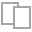
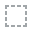
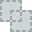
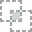
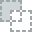
...
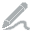
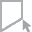
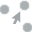
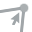
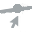

In [6]:
create_report(df)

# Analise exploratória

### Sulfates por Solids

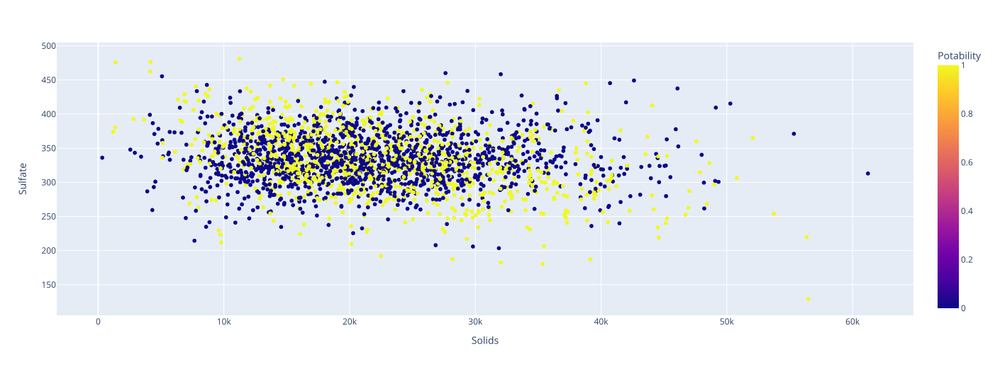

In [7]:
px.scatter(df, x='Solids', y='Sulfate', color='Potability', **layout)

### Dureza por PH

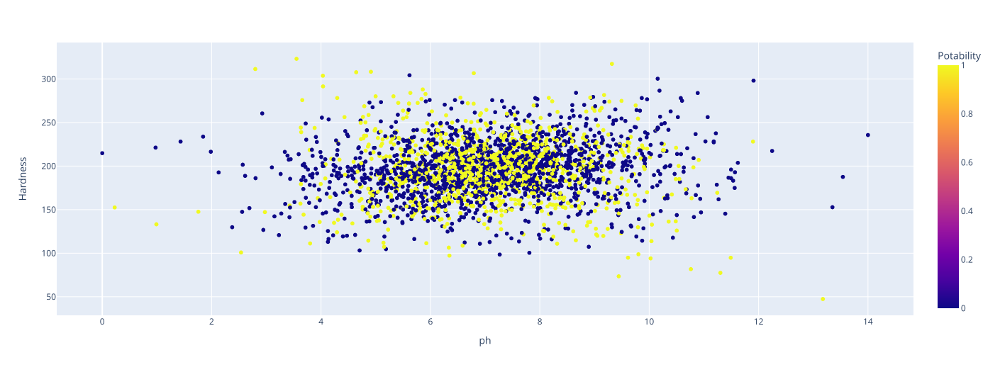

In [8]:
px.scatter(df, x='ph', y='Hardness', color='Potability', **layout)

# Engenharia de recursos

### Tratar dados nulos (ph, Sulfate e Trihalomethanes): atribuir a mediana

In [9]:
medianaPh = df['ph'].median()
medianaSulfate = df['Sulfate'].median()
medianaTrihalomethanes = df['Trihalomethanes'].median()

In [10]:
df['ph'].fillna(medianaPh, inplace = True)
df['Sulfate'].fillna(medianaSulfate, inplace = True)
df['Trihalomethanes'].fillna(medianaTrihalomethanes, inplace = True)

### Divisão dos dados:

In [11]:
df_train, df_test = train_test_split(df, test_size=1/10, random_state=0)

In [12]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler

myCols = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 
          'Organic_carbon', 'Trihalomethanes', 'Turbidity']
transformer = ColumnTransformer([
   ('selector', MinMaxScaler(), myCols)
])
#transformer = ColumnTransformer([
#  ("selector", "passthrough", myCols)
#])

In [13]:
X_train = transformer.fit_transform(df_train)
features = transformer.get_feature_names_out()
X_train = pd.DataFrame(X_train, columns=features)
X_test = pd.DataFrame(transformer.transform(df_test), columns=features)

In [14]:
y_train = df_train['Potability']
y_test = df_test['Potability']

# Seleção de modelo

In [15]:
# dataframe que armazenará o resultado dos modelos
resultados = pd.DataFrame(columns=['Method', 'MSE', 'MAE', 'MAPE'])
modelosTreinados = []

In [16]:
def plot_coefs(features, coefs, n=20, split_by_sign=True):
  df = pd.DataFrame({'feature': features, 'coef': coefs})
  # Filtrando e ordenando os dados
  coefs_negativos = df.nsmallest(n, 'coef').loc[lambda df: df.coef < 0].sort_values('coef', ascending=False)
  coefs_positivos = df.nlargest(n, 'coef').loc[lambda df: df.coef >= 0].sort_values('coef', ascending=True)
  trace_positivo = go.Bar(
    y=coefs_positivos['feature'], x=coefs_positivos['coef'],
    orientation='h', marker=dict(color='blue'))
  # Criando o subplot
  if split_by_sign:
    fig = make_subplots(rows=1, cols=2, subplot_titles=('Coeficientes Negativos', 'Coeficientes Positivos'))
    fig.add_trace(
      go.Bar(
        y=coefs_negativos['feature'], x=coefs_negativos['coef'],
        orientation='h', marker=dict(color='red'),
        name='Coeficientes Negativos'),
      row=1, col=1)
    fig.add_trace(trace_positivo, row=1, col=2)
    width = 1200
  else:
    fig = make_subplots(rows=1, cols=1, subplot_titles=('Coeficientes',))
    fig.add_trace(trace_positivo, row=1, col=1)
    width = 600
  fig.update_layout(barmode='stack', showlegend=False, width=width, height=800)
  fig.show()

In [17]:
# função que plota a Nota real vs Nota Predita
def plot_predict(y_test, y_predict):
  fig = px.strip(pd.DataFrame({'Nota real': y_test, 'Nota predita': y_predict}), x='Nota real', y='Nota predita', **layout)
  fig.show()

### Linear (MMQ)

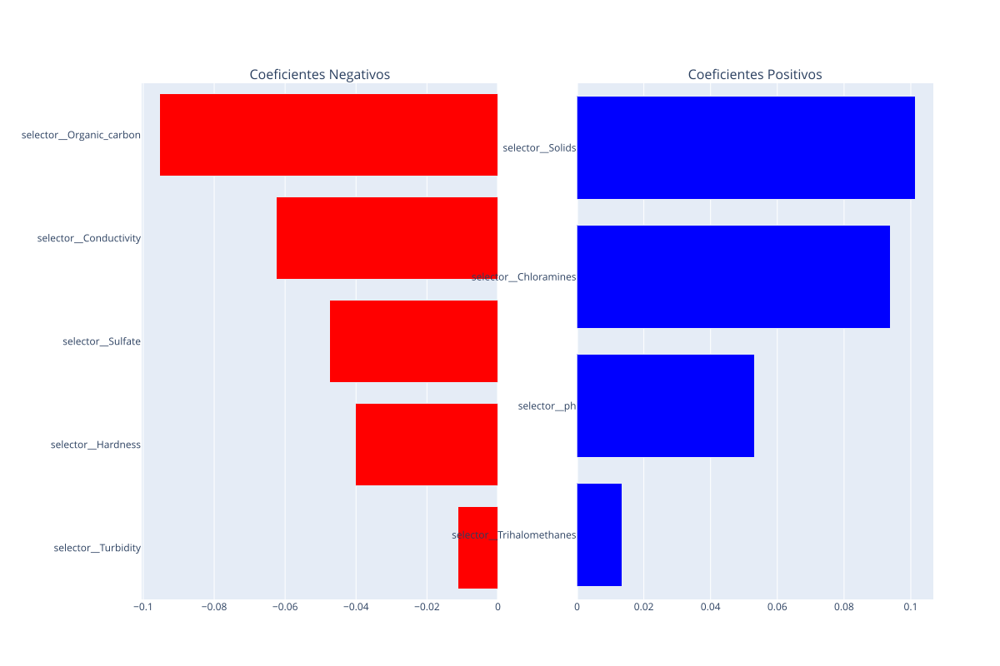

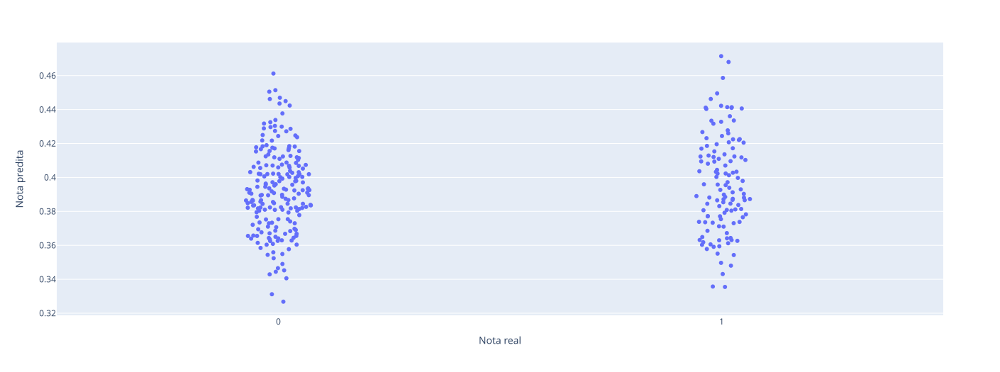

RESULTADOS: 


,Method,MSE,MAE,MAPE
0,Mínimos Quadrados,0.233655,0.471732,1.201106


In [18]:
# treinando modelo
linear = linear_model.LinearRegression().fit(X_train, y_train)

# plotando maiores coeficientes
plot_coefs(features=features, coefs=linear.coef_)

# plotando nota real x nota predita
plot_predict(y_test, y_predict = linear.predict(X_test))

predict = linear.predict(X_test)
resultados.loc[len(resultados)] = {
    'Method': "Mínimos Quadrados",
    'MSE': mean_squared_error(predict, y_test),
    'MAE': mean_absolute_error(predict, y_test),
    'MAPE': mean_absolute_percentage_error(predict, y_test)
}
modelosTreinados.append({'Method': "Mínimos Quadrados", 'modelo': linear, 'RFE': False})

print('RESULTADOS: ')
display(resultados)

### Linear (RFECV)

In [19]:
from sklearn.feature_selection import RFECV
linearRFE = linear_model.LinearRegression()
linear_rfe = RFECV(
    linearRFE, min_features_to_select=3,
    step=0.3, verbose=10, cv=2
    ).fit(X_train,y_train)
print('Variáveis selecionadas: ', features[linear_rfe.support_])

Fitting estimator with 9 features.
Fitting estimator with 7 features.
Fitting estimator with 5 features.
Fitting estimator with 9 features.
Fitting estimator with 7 features.
Fitting estimator with 5 features.
Fitting estimator with 9 features.
Fitting estimator with 7 features.
Fitting estimator with 5 features.
Variáveis selecionadas:  ['selector__Solids' 'selector__Chloramines' 'selector__Organic_carbon']


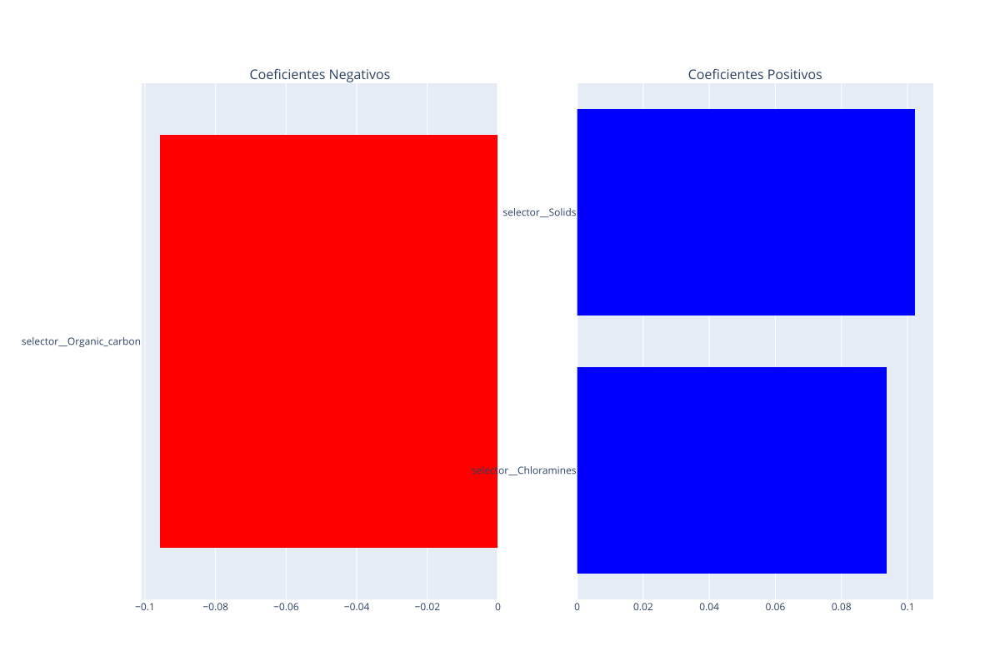

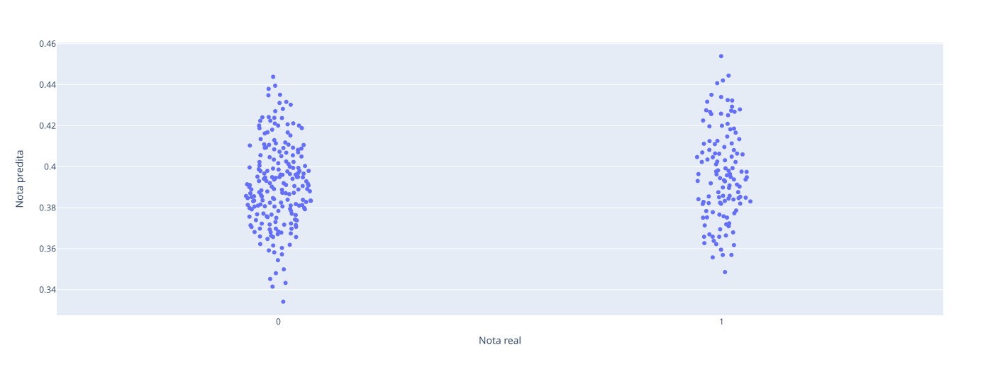

RESULTADOS: 


,Method,MSE,MAE,MAPE
0,Mínimos Quadrados,0.233655,0.471732,1.201106
1,Mínimos Quadrados RFE,0.232908,0.471043,1.199605


In [20]:
# treinando modelo
treino = X_train[features[linear_rfe.support_]]
teste = X_test[features[linear_rfe.support_]]
linearRFE = linear_model.LinearRegression().fit(treino,y_train)

# plotando maiores coeficientes
plot_coefs(
    features=[i for (i, v) in zip(features, linear_rfe.support_) if v],
    coefs=linearRFE.coef_)

# plotando nota real x nota predita
predict = linearRFE.predict(teste)
plot_predict(y_test, y_predict=predict)

# salvando resultados
resultados.loc[len(resultados)] = {
    'Method': "Mínimos Quadrados RFE",
    'MSE': mean_squared_error(predict, y_test),
    'MAE': mean_absolute_error(predict, y_test),
    'MAPE': mean_absolute_percentage_error(predict, y_test)
}
modelosTreinados.append({'Method': "Mínimos Quadrados RFE", 'modelo': linearRFE, 'RFE': True})

print('RESULTADOS: ')
display(resultados)

### Lasso

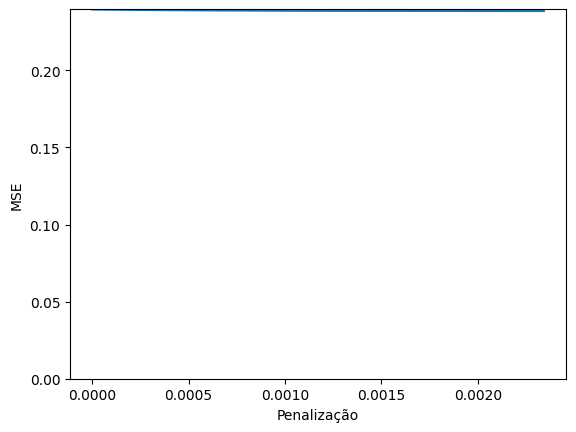

Best Alpha: 0.002340773834828861
Número de coeficientes iguais a 0: 8


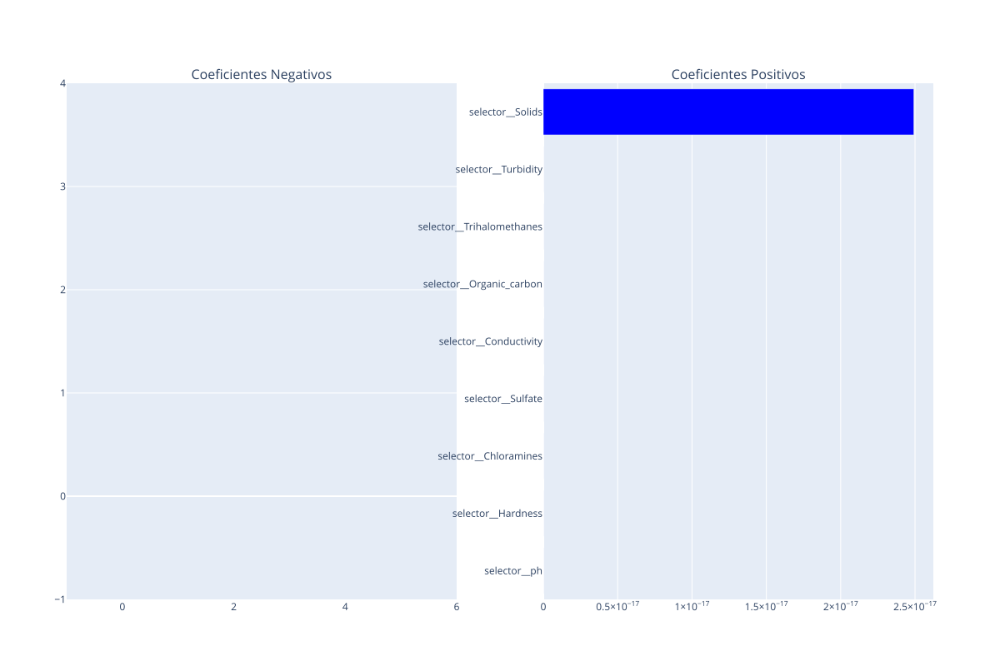

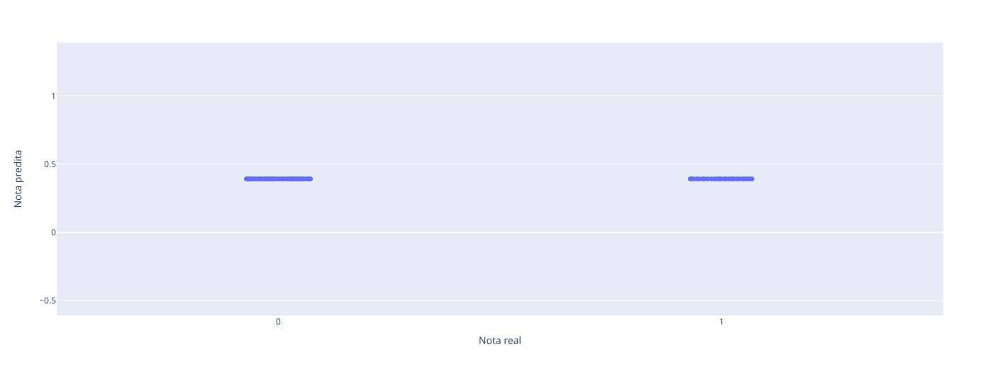

RESULTADOS: 


,Method,MSE,MAE,MAPE
0,Mínimos Quadrados,0.233655,0.471732,1.201106
1,Mínimos Quadrados RFE,0.232908,0.471043,1.199605
2,Lasso,0.234657,0.472948,1.207143


In [21]:
# treinando modelo
lasso = linear_model.LassoCV(cv=5).fit(X_train,y_train)

# plotando MSE x Penalização
plt.figure()
plt.plot(lasso.alphas_, lasso.mse_path_.mean(axis=-1),linewidth=2)
plt.ylim(bottom=0)
plt.xlabel('Penalização')
plt.ylabel('MSE')
plt.show()

# imprimir melhor alpha
print(f'Best Alpha: {lasso.alpha_}')
print(f'Número de coeficientes iguais a 0: {sum(lasso.coef_ == 0)}')

# plotando maiores coeficientes
plot_coefs(features=features, coefs=lasso.coef_)

# plotando nota real x nota predita
plot_predict(y_test, y_predict=lasso.predict(X_test))

predict = lasso.predict(X_test)
resultados.loc[len(resultados)] = {
    'Method': "Lasso",
    'MSE': mean_squared_error(predict, y_test),
    'MAE': mean_absolute_error(predict, y_test),
    'MAPE': mean_absolute_percentage_error(predict, y_test)
}
modelosTreinados.append({'Method': "Lasso", 'modelo': lasso, 'RFE': False})

print('RESULTADOS: ')
display(resultados)

### KKN

Best Paramns: {'n_neighbors': 36}


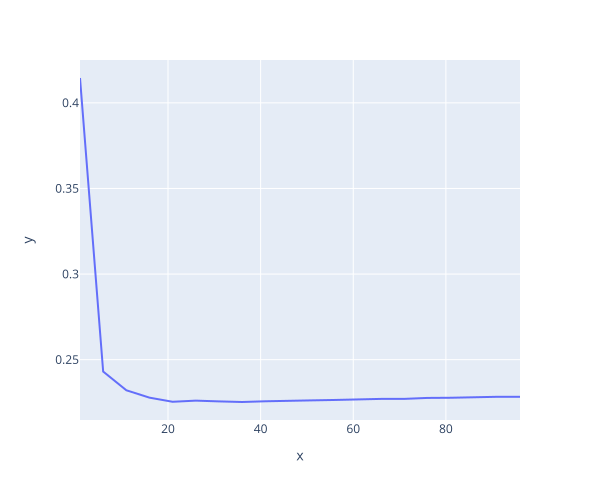

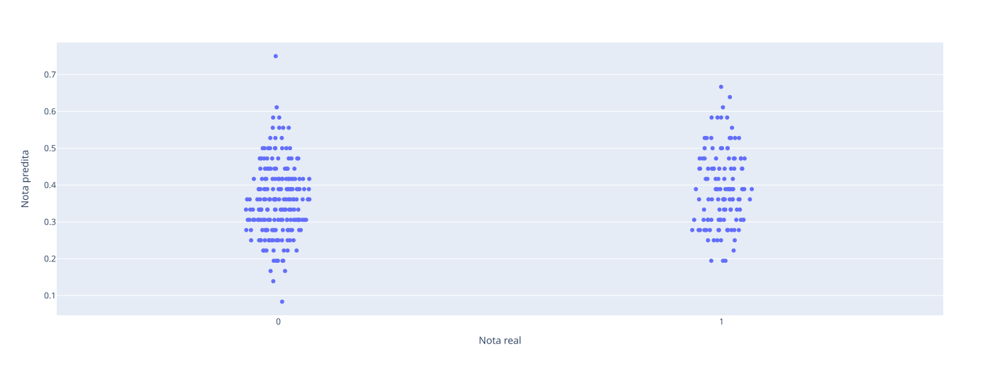

RESULTADOS: 


,Method,MSE,MAE,MAPE
0,Mínimos Quadrados,0.233655,0.471732,1.201106
1,Mínimos Quadrados RFE,0.232908,0.471043,1.199605
2,Lasso,0.234657,0.472948,1.207143
3,KNN,0.229094,0.452320,1.280440


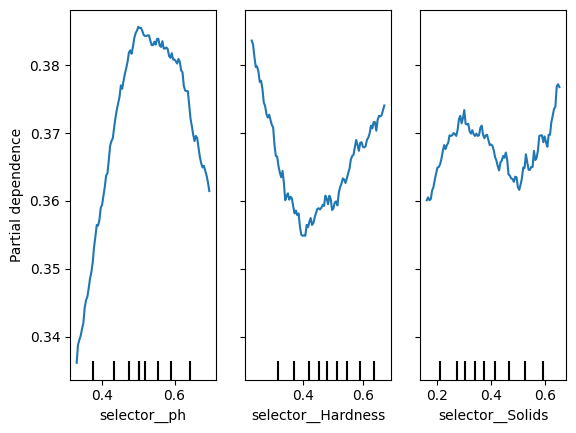

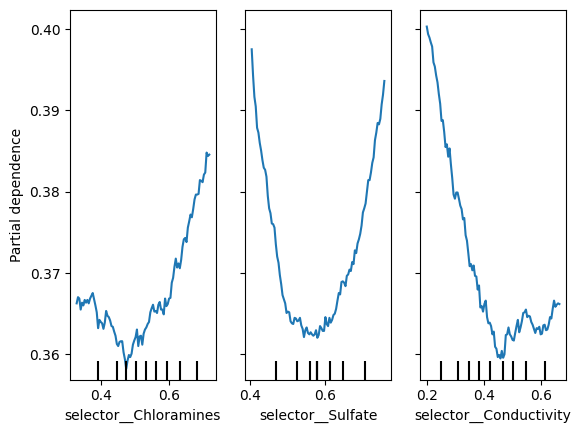

In [22]:
# criando modelo
knn = KNeighborsRegressor()

# otimização de hiperparametros
param_grid = {'n_neighbors': np.arange(1, 100, 5)}
knn_gscv = GridSearchCV(knn, param_grid, cv=5,
                        scoring = make_scorer(mse,greater_is_better=False))
knn_gscv.fit(pd.DataFrame(X_train, columns=features), y_train)

print(f'Best Paramns: {knn_gscv.best_params_}')

px.line(x=param_grid['n_neighbors'], y=knn_gscv.cv_results_['mean_test_score']*-1, width=600).show()

# plotando partial dependence
PartialDependenceDisplay.from_estimator(knn_gscv, pd.DataFrame(X_test, columns=features), ['selector__ph','selector__Hardness', 'selector__Solids'])
PartialDependenceDisplay.from_estimator(knn_gscv, pd.DataFrame(X_test, columns=features), ['selector__Chloramines' , 'selector__Sulfate',  'selector__Conductivity'])

# plotando nota real x nota predita
plot_predict(y_test, y_predict=knn_gscv.predict(pd.DataFrame(X_test, columns=features)))

# salvando resultados
predict = knn_gscv.predict(pd.DataFrame(X_test, columns=features))
resultados.loc[len(resultados)] = {
    'Method': "KNN",
    'MSE': mean_squared_error(predict, y_test),
    'MAE': mean_absolute_error(predict, y_test),
    'MAPE': mean_absolute_percentage_error(predict, y_test)
}
modelosTreinados.append({'Method': "KNN", 'modelo': knn_gscv, 'RFE': False})

print('RESULTADOS: ')
display(resultados)

KNN RFE

Best Paramns: {'n_neighbors': 91}


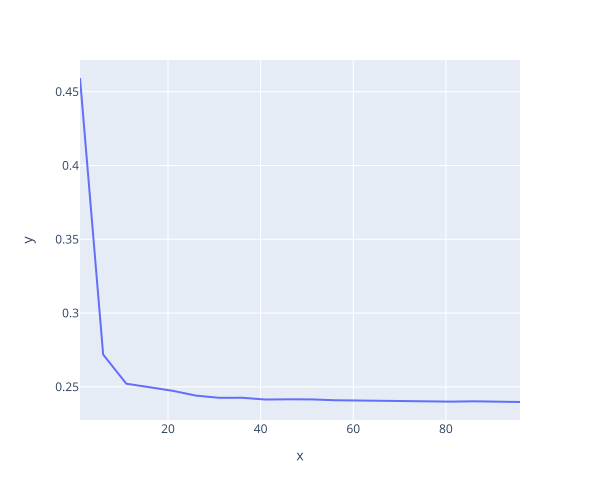

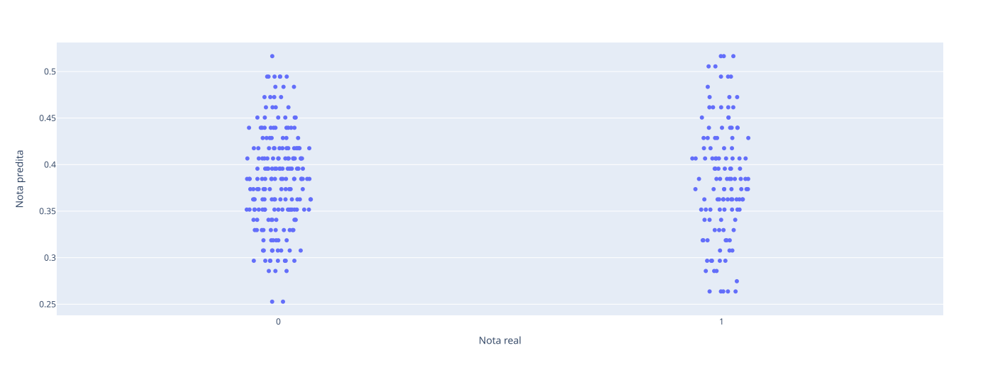

RESULTADOS: 


,Method,MSE,MAE,MAPE
0,Mínimos Quadrados,0.233655,0.471732,1.201106
1,Mínimos Quadrados RFE,0.232908,0.471043,1.199605
2,Lasso,0.234657,0.472948,1.207143
3,KNN,0.229094,0.452320,1.280440
4,KNN RFE,0.237411,0.470685,1.254188


In [23]:
# criando modelo
knn = KNeighborsRegressor()

# otimização de hiperparametros
param_grid = {'n_neighbors': np.arange(1, 100, 5)}
knn_gscv_RFE = GridSearchCV(knn, param_grid, cv=5,
                        scoring = make_scorer(mse,greater_is_better=False))
selectedColumns = features[linear_rfe.support_]
knn_gscv_RFE.fit(pd.DataFrame(X_train[selectedColumns], columns=selectedColumns), y_train)

print(f'Best Paramns: {knn_gscv_RFE.best_params_}')

px.line(x=param_grid['n_neighbors'], y=knn_gscv_RFE.cv_results_['mean_test_score']*-1, width=600).show()


# plotando nota real x nota predita
y_predict = knn_gscv_RFE.predict(pd.DataFrame(X_test[selectedColumns], columns=selectedColumns))
plot_predict(y_test, y_predict=y_predict)

# salvando resultados
resultados.loc[len(resultados)] = {
    'Method': "KNN RFE",
    'MSE': mean_squared_error(y_predict, y_test),
    'MAE': mean_absolute_error(y_predict, y_test),
    'MAPE': mean_absolute_percentage_error(y_predict, y_test)
}
modelosTreinados.append({'Method': "KNN RFE", 'modelo': knn_gscv_RFE, 'RFE': True})

print('RESULTADOS: ')
display(resultados)

### Árvore

{'max_depth': 3}


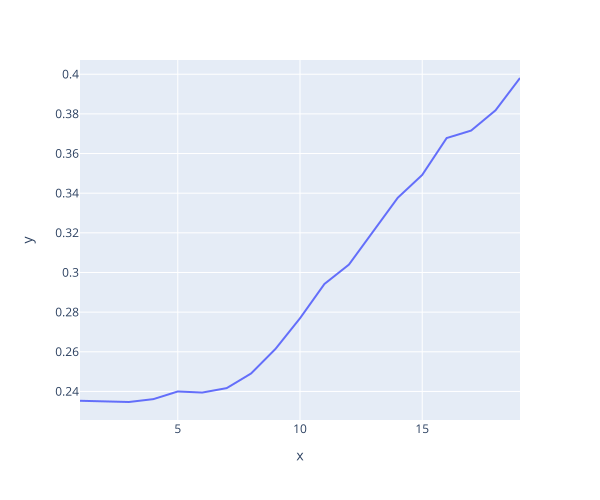

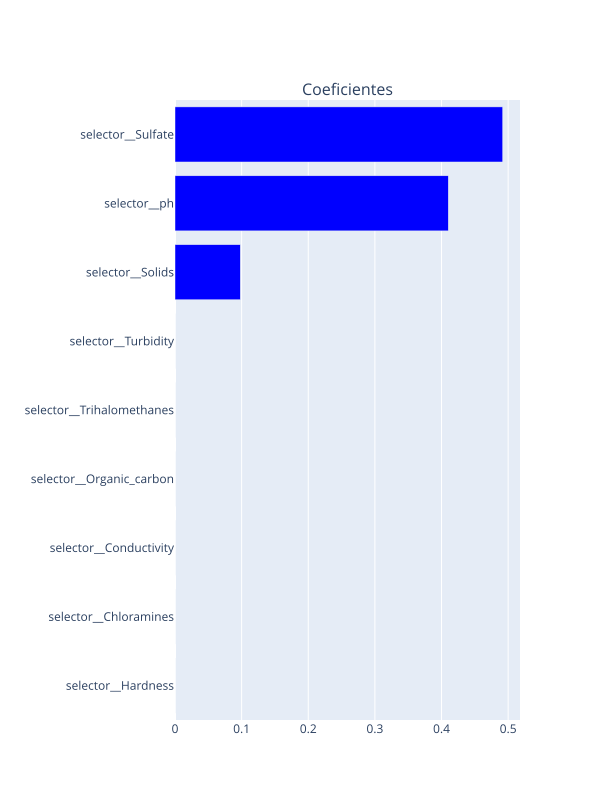

RESULTADOS: 


,Method,MSE,MAE,MAPE
0,Mínimos Quadrados,0.233655,0.471732,1.201106
1,Mínimos Quadrados RFE,0.232908,0.471043,1.199605
2,Lasso,0.234657,0.472948,1.207143
3,KNN,0.229094,0.452320,1.280440
4,KNN RFE,0.237411,0.470685,1.254188
5,Árvore de Decisão,0.230879,0.455745,1.221258


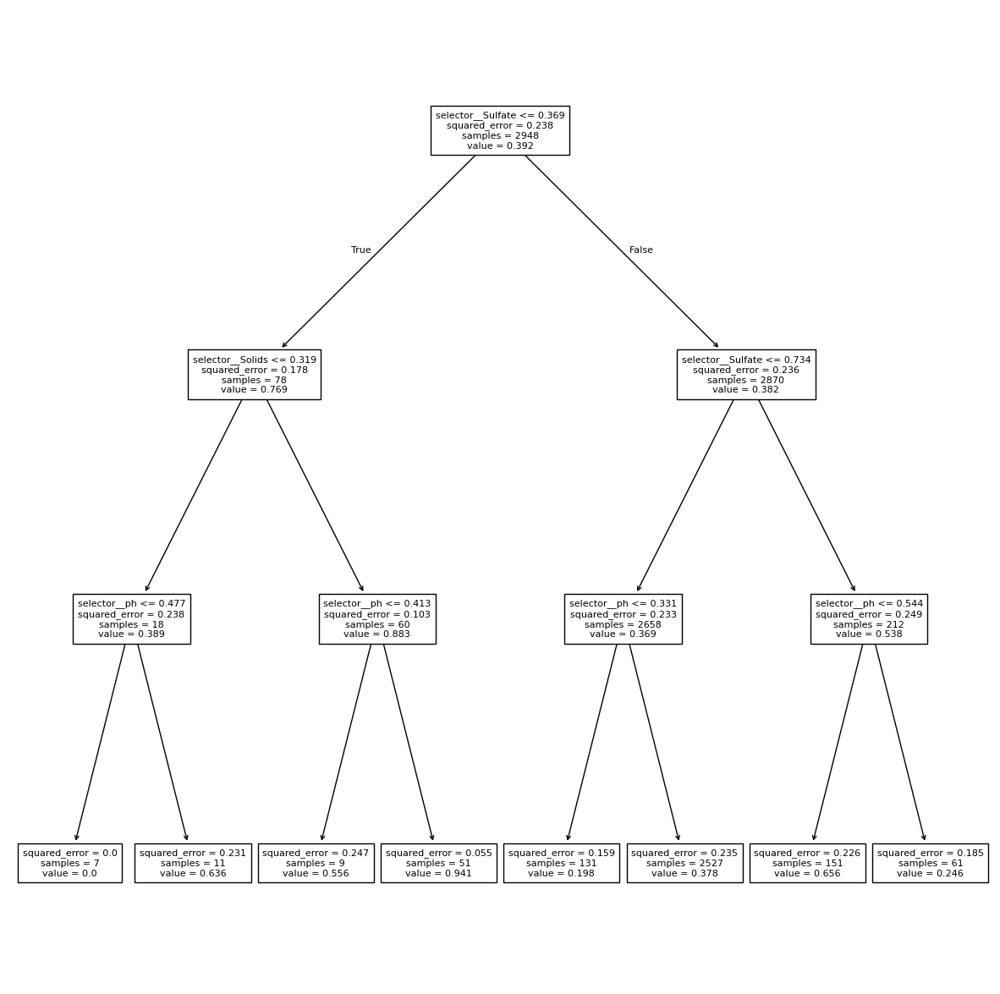

In [24]:
# criando modelo
tree = DecisionTreeRegressor(random_state=0)

# otimização de hiperparametros
param_grid = {'max_depth':np.arange(1, 20)}
tree_gscv = GridSearchCV(tree, param_grid, cv=5,scoring=make_scorer(mse,greater_is_better=False))
tree_gscv.fit(X_train, y_train)
print(tree_gscv.best_params_)

px.line(x=param_grid['max_depth'], y=tree_gscv.cv_results_['mean_test_score']*-1, width=600).show()

plot_coefs(features=features, coefs=tree_gscv.best_estimator_.feature_importances_, split_by_sign=False)

fig, ax = plt.subplots(figsize=(15, 15))
plot_tree(tree_gscv.best_estimator_, fontsize=8, ax=ax, feature_names=features)
fig.show()

# salvando resultados
predict = tree_gscv.predict(X_test)
resultados.loc[len(resultados)] = {
    'Method': "Árvore de Decisão",
    'MSE': mean_squared_error(predict, y_test),
    'MAE': mean_absolute_error(predict, y_test),
    'MAPE': mean_absolute_percentage_error(predict, y_test)
}
modelosTreinados.append({'Method': "Árvore de Decisão", 'modelo': tree_gscv, 'RFE': False})

print('RESULTADOS: ')
display(resultados)

### Floresta

In [25]:
# criando modelo
floresta = RandomForestRegressor(random_state = 0)

# otimização de hiperparametros
param_grid = {'max_depth': [3, 7, 15], 'n_estimators': [100, 200, 300], 'max_samples': [.8, None], 'min_samples_split': [2, 5, 10]}
floresta_rscv = RandomizedSearchCV(floresta, param_grid, cv=10, scoring=make_scorer(mse,greater_is_better=False), n_iter=10)
floresta_rscv.fit(X_train, y_train)
print(floresta_rscv.best_params_)

{'n_estimators': 300, 'min_samples_split': 10, 'max_samples': None, 'max_depth': 15}


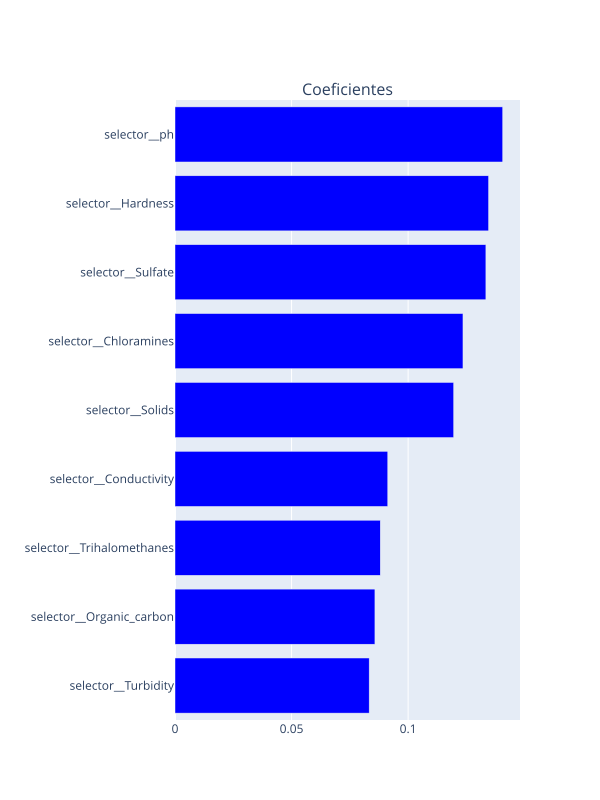

RESULTADOS: 


,Method,MSE,MAE,MAPE
0,Mínimos Quadrados,0.233655,0.471732,1.201106
1,Mínimos Quadrados RFE,0.232908,0.471043,1.199605
2,Lasso,0.234657,0.472948,1.207143
3,KNN,0.229094,0.452320,1.280440
4,KNN RFE,0.237411,0.470685,1.254188
5,Árvore de Decisão,0.230879,0.455745,1.221258
6,Floresta,0.208137,0.419968,1.237307


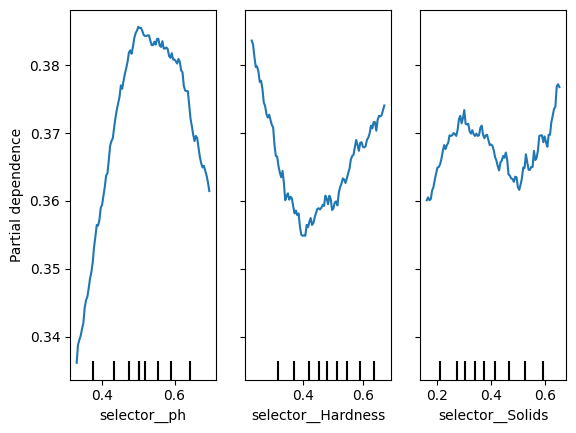

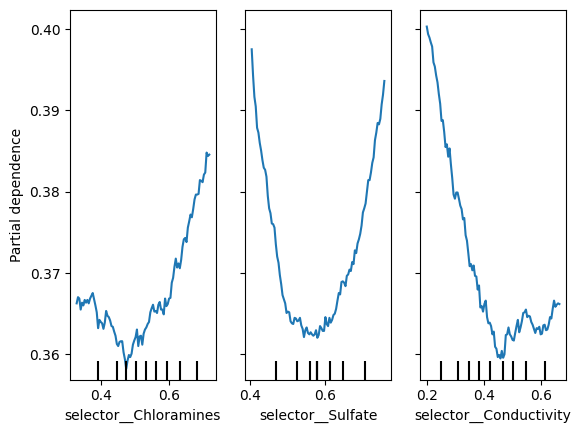

In [26]:
# utilizando o melhores parametros
floresta.set_params(**floresta_rscv.best_params_)
floresta.fit(X_train,y_train)

plot_coefs(features=features, coefs=floresta.feature_importances_, split_by_sign=False)

# plotando partial dependenc
PartialDependenceDisplay.from_estimator(knn_gscv, pd.DataFrame(X_test, columns=features), ['selector__ph','selector__Hardness', 'selector__Solids'])
PartialDependenceDisplay.from_estimator(knn_gscv, pd.DataFrame(X_test, columns=features), ['selector__Chloramines' , 'selector__Sulfate',  'selector__Conductivity'])

# salvando resultados
predict = floresta.predict(X_test)
resultados.loc[len(resultados)] = {
    'Method': "Floresta",
    'MSE': mean_squared_error(predict, y_test),
    'MAE': mean_absolute_error(predict, y_test),
    'MAPE': mean_absolute_percentage_error(predict, y_test)
}
modelosTreinados.append({'Method': "Floresta", 'modelo': floresta, 'RFE': False})

print('RESULTADOS: ')
display(resultados)

### XGBoost

In [27]:
from sklearn.base import BaseEstimator, ClassifierMixin

class SklearnXGBRegressor(BaseEstimator, ClassifierMixin):
  def __init__(self, **kwargs):
    self.model = xgb.XGBRegressor(**kwargs)

  def fit(self, X, y, **kwargs):
    self.model.fit(X, y, **kwargs)
    return self

  def predict(self, X):
    return self.model.predict(X)

  def predict_proba(self, X):
    return self.model.predict_proba(X)

  def get_params(self, deep=True):
    return self.model.get_params(deep)

  def evals_result(self):
    return self.model.evals_result()

  def set_params(self, **params):
    self.model.set_params(**params)
    return self

#xgb_model = SklearnXGBRegressor(objective='binary:logistic', early_stopping_rounds=10)
xgb_model = SklearnXGBRegressor(early_stopping_rounds=10)

#grid_search = GridSearchCV(xgb, param_grid, scoring='accuracy', cv=5, verbose=1)


{'subsample': 1, 'n_estimators': 400, 'min_child_weight': 10, 'max_depth': 12, 'eta': 0.01, 'colsample_bytree': 1}
{'validation_0': OrderedDict([('rmse', [0.4863733085014256, 0.48487277802684703, 0.4835724395202558, 0.4821440316985025, 0.48074794945900984, 0.4795116020503935, 0.4781364299057677, 0.47676935930679065, 0.47541076176021013, 0.47406711121703116, 0.4729068367698451, 0.47176442016860526, 0.4706617499777013, 0.4695270616583129, 0.4684680509973586, 0.4672322218614473, 0.46598910171001745, 0.46477307400330947, 0.4636064753159745, 0.4624828011202546, 0.4613349150555959, 0.4602609926069635, 0.45904949855818533, 0.45785610325431364, 0.4568658967748341, 0.4557121574841971, 0.454604904377903, 0.45352302538900485, 0.4525101973826686, 0.4515222511976558, 0.4505253586287642, 0.44953306638576507, 0.4485568722447622, 0.44763021250264556, 0.4469924510441454, 0.4463697160165992, 0.44579538139445885, 0.4451959732564016, 0.44439236303000346, 0.4438167122621087, 0.442990555713239, 0.4424255702

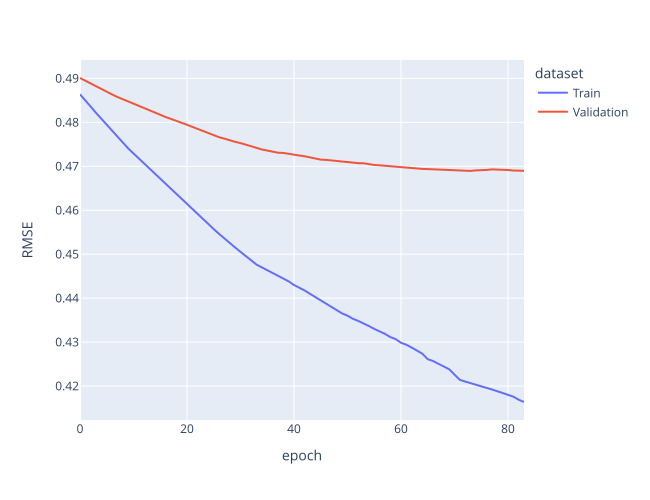

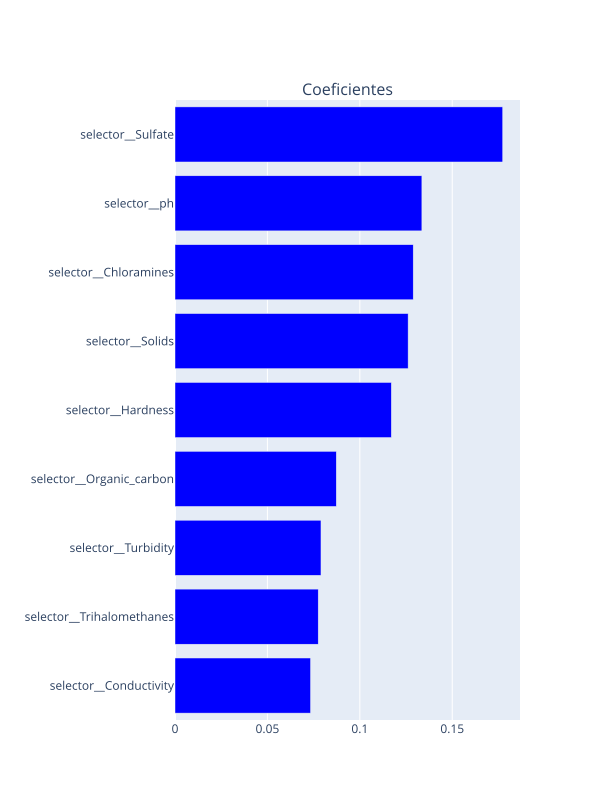

RESULTADOS: 


,Method,MSE,MAE,MAPE
0,Mínimos Quadrados,0.233655,0.471732,1.201106
1,Mínimos Quadrados RFE,0.232908,0.471043,1.199605
2,Lasso,0.234657,0.472948,1.207143
3,KNN,0.229094,0.452320,1.280440
4,KNN RFE,0.237411,0.470685,1.254188
5,Árvore de Decisão,0.230879,0.455745,1.221258
6,Floresta,0.208137,0.419968,1.237307
7,XGBoost,0.219038,0.446893,1.203767


In [28]:
# criando modelo
#xgb_model = xgb.XGBRegressor(early_stopping_rounds=10)

# otimização de hiperparametros
parameters = {'max_depth': [3,7,12],
              'min_child_weight': [5,10,20],
              'subsample': [0.8,1],
              'colsample_bytree': [0.75,1],
              'n_estimators': [400],
              'eta':[0.01,0.1,0.5]}

X_train_1, X_val, y_train_1, y_val = train_test_split(X_train, y_train, test_size=1/10, random_state=7)
eval_set = [(X_train_1,y_train_1),(X_val, y_val)]

xgb_model_gscv = RandomizedSearchCV(xgb_model, parameters, n_jobs=4, cv=10, scoring=make_scorer(mse,greater_is_better=False), n_iter=10)
xgb_model_gscv.fit(
    X_train_1, y_train_1,
    eval_set=eval_set,
    verbose=0)

print(xgb_model_gscv.best_params_)
xgb_results = xgb_model_gscv.best_estimator_.evals_result()

print(xgb_results)
# plot
epochs = len(xgb_results['validation_0']['rmse'])
x_axis = range(0, epochs)
px.line(pd.concat([
  pd.DataFrame({'epoch': x_axis, 'RMSE': xgb_results['validation_0']['rmse']}).assign(dataset='Train'),
  pd.DataFrame({'epoch': x_axis, 'RMSE': xgb_results['validation_1']['rmse']}).assign(dataset='Validation'),
]), x='epoch', y='RMSE', color='dataset', width=650).show()

# plotando as variaveis mais importantes
plot_coefs(features=features, coefs=xgb_model_gscv.best_estimator_.model.feature_importances_, split_by_sign=False)

# salvando resultados
predict = xgb_model_gscv.predict(X_test)
resultados.loc[len(resultados)] = {
    'Method': "XGBoost",
    'MSE': mean_squared_error(predict, y_test),
    'MAE': mean_absolute_error(predict, y_test),
    'MAPE': mean_absolute_percentage_error(predict, y_test)
}
modelosTreinados.append({'Method': "XGBoost", 'modelo': xgb_model_gscv, 'RFE': False})

print('RESULTADOS: ')
display(resultados)

### Logística

#### Funções

In [46]:
from sklearn import metrics
from sklearn.metrics  import RocCurveDisplay, PrecisionRecallDisplay
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import log_loss, precision_score, recall_score
from sklearn.metrics import ConfusionMatrixDisplay

models = {}

In [47]:
def optimalThreshold(roc):
  point = roc.iloc[(roc.tf-0).abs().argsort()[0]]
  plt.scatter(
    point['fpr'], point['tpr'], color = 'purple', s = 50,
    label = f"optimal threshold  = {point['thresholds'].round(2)}"
  )

def dotFiveThreshold(roc):
  point = roc.iloc[(roc.thresholds-0.5).abs().argsort()[:1][0]]
  plt.scatter(
    point['fpr'], point['tpr'], color = 'orange', s = 50,
    label = 'threshold = 0.50'
  )

def plot_roc_curve_threshold(y_true, y_pred_proba):
  fpr, tpr, thresholds = metrics.roc_curve(y_true,  y_pred_proba)
  auc = metrics.roc_auc_score(y_true, y_pred_proba)

  roc = pd.DataFrame({
    'fpr' : fpr,
    'tpr' : tpr,
    'tf' : tpr - (1-fpr),
    'thresholds' : thresholds
  })

  plt.plot(roc['fpr'],roc['tpr'],label="auc="+str(auc))
  plt.plot( [0,1], [0,1], '--r')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')

  # optimal threshold
  optimalThreshold(roc)

  # .5 threshold
  dotFiveThreshold(roc)
  
  plt.legend()
  plt.show()

def getFeaturesFromModel(model):
  if(hasattr(model, 'feature_names_in_')):
    return model.feature_names_in_
  if(hasattr(model, 'feature_names_')):
    return model.feature_names_

def plot_models_roc_curve(models, X_test, y_test):
  models = list(models.values())
  feat0 = getFeaturesFromModel(models[0])
  plot_ax = RocCurveDisplay.from_estimator(models[0], X_test[feat0], y_test)
  for i in range(1, len(models)):
    feat = getFeaturesFromModel(models[i])
    RocCurveDisplay.from_estimator(models[i], X_test[feat], y_test, ax=plot_ax.ax_)
  plt.show()

def plot_roc_curve(models, X_test, y_test):
  print('Curva ROC ', list(models.keys())[-1])
  feat = getFeaturesFromModel(list(models.values())[-1])
  plot_roc_curve_threshold(y_true=y_test, y_pred_proba=list(models.values())[-1].predict_proba(X_test[feat])[:,1])
  print('Comparação de modelos')
  plot_models_roc_curve(models, X_test, y_test)

# função que plota os n maiores coeficientes positivos e negativos
def plot_coefs(coefs, n):
  fig, (ax1, ax2) = plt.subplots(1, 2)
  ax2.yaxis.tick_right()
  coefs.nsmallest(n, 'coef').query('coef < 0').sort_values('coef', ascending = False).plot(kind = 'barh', x = 'features', y = 'coef', color = 'red',  title = 'Coeficientes Negativos', legend=False, ax=ax1)
  coefs.nlargest(n, 'coef').query('coef >= 0').sort_values('coef', ascending = True).plot(kind = 'barh', x = 'features', y = 'coef', color = 'blue', title = 'Coeficientes Positivos', legend=False, ax=ax2, xlabel = "")
  #fig.tight_layout()

In [48]:
resultados = pd.DataFrame(columns = ['Method','Acurácia', 'Precisão', "Recall",'F1','Log-loss'])

def get_model_metrics(model_name, threshold, y_prob, y_test):
  # salvando resultado
  y_pred = (y_prob > threshold)*1
  acc_estimate = round(acc(y_test,y_pred), 3)
  log_estimate = round(log_loss(y_test,y_prob), 3)
  precision = round(precision_score(y_test, y_pred), 3)
  recall = round(recall_score(y_test, y_pred), 3)
  f1_score = round(metrics.f1_score(y_test, y_pred), 3)
  ConfusionMatrixDisplay.from_predictions(y_test, y_pred, normalize = 'all')
  plt.show()

  return pd.DataFrame({
    'Method': [model_name],
    'Acurácia': [acc_estimate],
    "Precisão": [precision],
    "Recall": [recall],
    'F1': [f1_score],
    'Log-loss': [log_estimate]
  })

### Logística sem penalização

In [49]:
models['Logistica sem penalização'] = linear_model.LogisticRegression(
  penalty = None, max_iter=1000
).fit(X = X_train,y = y_train)

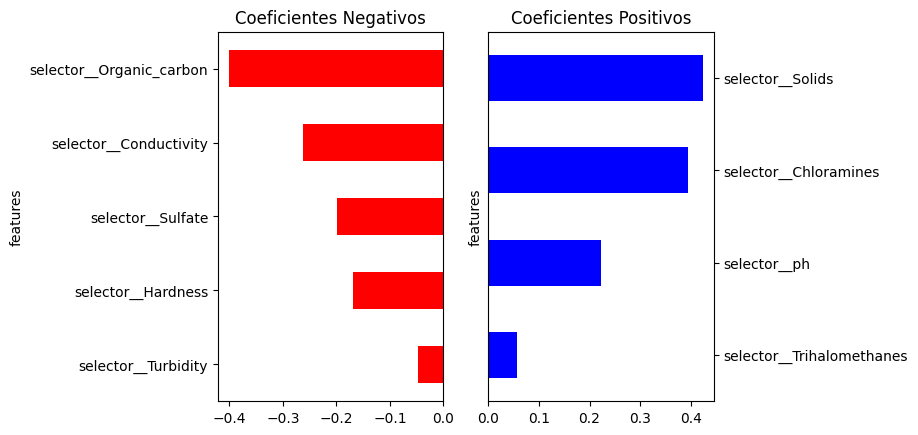

In [50]:
# plotando maiores coeficientes
plot_coefs(
  coefs = pd.DataFrame({
    'features':features,
    'coef':models['Logistica sem penalização'].coef_[0]
  }),
  n = 20
)

Curva ROC  Logistica sem penalização


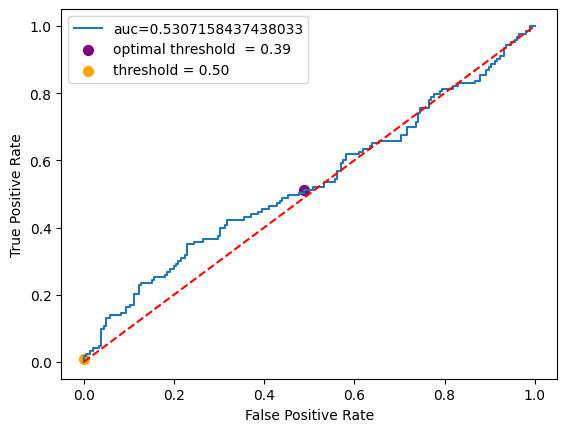

Comparação de modelos


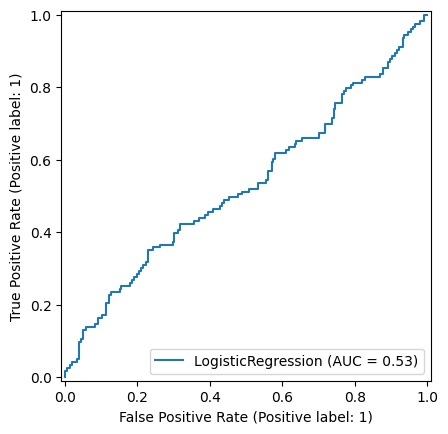

In [51]:
# ROC curve
plot_roc_curve(models, X_test, y_test)

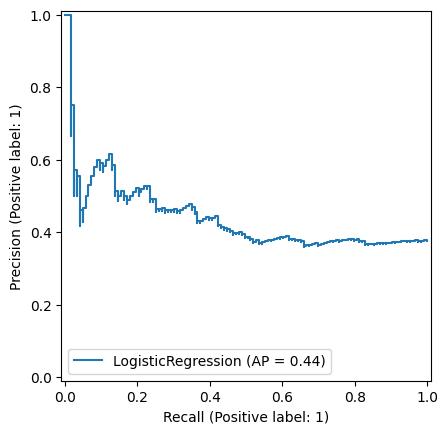

In [52]:
PrecisionRecallDisplay.from_estimator(models['Logistica sem penalização'], X_test, y_test)

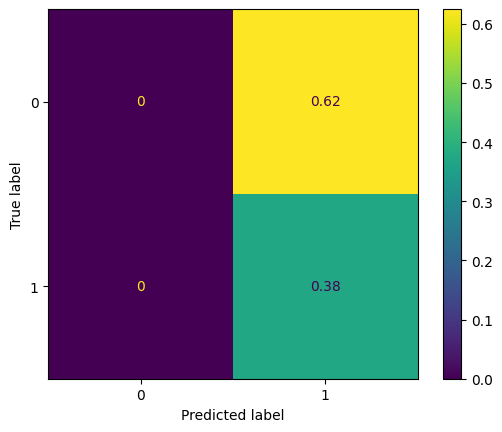

,Method,Acurácia,Precisão,Recall,F1,Log-loss
0,Logistica sem penalização,0.375,0.375,1.0,0.545,0.66


In [53]:
resultado_modelo = get_model_metrics(
  model_name='Logistica sem penalização',
  threshold=.16,
  y_prob=models['Logistica sem penalização'].predict_proba(X_test)[:,1],
  y_test=y_test)

resultados = pd.concat([resultados, resultado_modelo])
resultados

### Logística com penalização L1

In [66]:
models['Logistica penalização L1'] = linear_model.LogisticRegressionCV(
  penalty="l1",solver='liblinear',scoring='neg_log_loss',
  max_iter=100, cv=10
).fit(X=X_train,y=y_train)

In [67]:
print(f"total de variaveis com coeficientes 0 = {sum(models['Logistica penalização L1'].coef_[0]==0)}")
print(f"total de variaveis = {len(models['Logistica penalização L1'].coef_[0])}")

total de variaveis com coeficientes 0 = 9
total de variaveis = 9


## Considerações Finais

- Todas as variáveis foram descartadas na regularização. 
- Acredito que não é problema de modelo e que há algo errado nesses dados.
- Ou são falsos, ou não são suficientes para determinar potabilidade.
- Mais provável que sejam falsos.